## **What Features make a Hit?**

### **Problem Statement**

The billboard 100 ranks the best tracks every week based on radio play, streaming activity and sales. However, with the rise of platforms like TikTok, it’s increasingly difficult to distinguish lasting hits from short-lived viral trends. As a data analyst, your task is to examine billboard hot 100 data for the past 2 decades to uncover what makes a track a “hit”. Since genre classifications are unreliable, this project focuses on numerical audio features such as tempo, popularity, danceability. The objective is to identify trends over time and determine which features correlate most strongly with higher chart rankings.

### **What's a Hit?**

A track is a "hit" if it reached the top 10 on any weekly Billboard chart and stayed on the chart for at least 4 weeks.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
billboard_data = pd.read_csv("../data/processed/cleaned_billboard_data.csv")

In [3]:
billboard_data.head(5)

,date,song_name,artist,weeks_rank,last_weeks_rank,weeks_on_chart,Tempo,uri,Artist Name(s),Album Name,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Time Signature,Label,Track Duration (min)
0,2000-01-02,Smooth,Santana Featuring Rob Thomas,1,1.0,24,115.996,spotify:track:0n2SEXB2qoRQg171q7XqeW,"Santana, Rob Thomas",Supernatural (Remastered),...,-3.908,1.0,0.0338,0.1600,0.000005,0.2950,0.9610,4.0,Columbia/Legacy,4.916433
1,2000-01-02,Back At One,Brian McKnight,2,2.0,20,129.747,spotify:track:6mwA6YiKDjAUG8kWvRRUPh,Brian McKnight,Back At One,...,-9.114,1.0,0.0300,0.4520,0.000000,0.1310,0.2560,4.0,Motown,4.394433
2,2000-01-02,I Wanna Love You Forever,Jessica Simpson,3,3.0,13,104.042,spotify:track:5gZEhPrN1VLqTG1nIAXeNK,Jessica Simpson,Sweet Kisses,...,-4.047,0.0,0.0244,0.1560,0.000000,0.1360,0.0743,4.0,Columbia,4.396667
3,2000-01-02,My Love Is Your Love,Whitney Houston,4,4.0,19,82.511,spotify:track:1ckU1EhAO0Nr73QYw24SWJ,Whitney Houston,My Love Is Your Love,...,-9.512,1.0,0.1590,0.0561,0.000005,0.0607,0.4730,4.0,Arista,4.359550
4,2000-01-02,Hot Boyz,"Missy ""Misdemeanor"" Elliott Featuring NAS, EVE...",5,7.0,7,81.125,spotify:track:7mYvtEeBdMqRSyj1Qpv6my,Missy Elliott,Da Real World,...,-11.241,1.0,0.2910,0.3390,0.000000,0.1800,0.5270,4.0,Atlantic Records/ATG,3.591100


### Data Cleaning

In [4]:
billboard_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132239 entries, 0 to 132238
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   date                  132239 non-null  object 
 1   song_name             132239 non-null  object 
 2   artist                132239 non-null  object 
 3   weeks_rank            132239 non-null  int64  
 4   last_weeks_rank       132239 non-null  float64
 5   weeks_on_chart        132239 non-null  int64  
 6   Tempo                 132239 non-null  float64
 7   uri                   132239 non-null  object 
 8   Artist Name(s)        132239 non-null  object 
 9   Album Name            132239 non-null  object 
 10  Album Release Date    132239 non-null  object 
 11  Track Duration (ms)   132239 non-null  float64
 12  Explicit              132239 non-null  bool   
 13  Popularity            132239 non-null  float64
 14  Danceability          132239 non-null  float64
 15  

In [5]:
temp_data = billboard_data.copy()

In [6]:
temp_data["date"] = pd.to_datetime(temp_data["date"])

In [7]:
cols_with_missing_rows = temp_data.columns[temp_data.isna().sum() > 1]
print(cols_with_missing_rows)

Index([], dtype='object')


In [8]:
temp_data.fillna({"last_weeks_rank":101}, inplace=True) #101 to signal new entries

In [9]:
cols_with_missing_rows = temp_data.columns[temp_data.isna().sum() > 1]

In [10]:
print(temp_data[cols_with_missing_rows].isna().sum())

Series([], dtype: float64)


In [11]:
temp_data.dropna(how="any", inplace=True)

In [12]:
print(temp_data.shape)

(132239, 27)


In [13]:
print(temp_data.isna().sum())

date                    0
song_name               0
artist                  0
weeks_rank              0
last_weeks_rank         0
weeks_on_chart          0
Tempo                   0
uri                     0
Artist Name(s)          0
Album Name              0
Album Release Date      0
Track Duration (ms)     0
Explicit                0
Popularity              0
Danceability            0
Energy                  0
Key                     0
Loudness                0
Mode                    0
Speechiness             0
Acousticness            0
Instrumentalness        0
Liveness                0
Valence                 0
Time Signature          0
Label                   0
Track Duration (min)    0
dtype: int64


### Data Exploration

In [14]:
temp_data["Explicit"].value_counts()

Explicit
False    90000
True     42239
Name: count, dtype: int64

In [15]:
temp_data["Mode"].value_counts()

Mode
1.0    88003
0.0    44236
Name: count, dtype: int64

In [16]:
temp_data["Label"].value_counts()

Label
Columbia                                                 5100
Warner Records                                           3791
RCA Records Label                                        3789
Atlantic Records                                         3502
Jive                                                     2555
                                                         ... 
APG, Inc. - Odetari II                                      1
ABKCO Music and Records, Inc.                               1
Maybach Music Group under exclusive license to gamma.       1
Surf Curse                                                  1
HYBE/Geffen                                                 1
Name: count, Length: 1350, dtype: int64

In [17]:
temp_data["artist"].value_counts() #top charted artists without fetured tracks counted

artist
Taylor Swift                                          1589
Drake                                                  963
Morgan Wallen                                          804
Kenny Chesney                                          728
Keith Urban                                            674
                                                      ... 
Young Thug & Gunna Featuring Travis Scott                1
Young Thug Featuring Lil Uzi Vert & Yung Kayo            1
Young Thug Featuring Rowdy Rebel                         1
Young Thug & Gunna Featuring Lil Baby & YTB Trench       1
Young Thug & Gunna Featuring Yak Gotti & Lil Duke        1
Name: count, Length: 5024, dtype: int64

In [18]:
lasting_hits = temp_data.sort_values(by=["weeks_on_chart"], ascending=False).drop_duplicates(subset=["song_name", "artist"])
lasting_hits.head(5)

,date,song_name,artist,weeks_rank,last_weeks_rank,weeks_on_chart,Tempo,uri,Artist Name(s),Album Name,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Time Signature,Label,Track Duration (min)
118760,2022-10-16,Heat Waves,Glass Animals,21,20.0,91,80.870,spotify:track:3USxtqRwSYz57Ewm6wWRMp,Glass Animals,Dreamland,...,-6.900,1.0,0.0944,0.44000,0.000007,0.0921,0.531,4.0,Polydor Records,3.980083
132145,2025-05-11,Lose Control,Teddy Swims,7,7.0,90,159.920,spotify:track:17phhZDn6oGtzMe56NuWvj,Teddy Swims,I've Tried Everything But Therapy (Part 1),...,-4.409,1.0,0.0337,0.19900,0.000019,0.1040,0.242,3.0,Warner Records,3.511467
112859,2021-08-29,Blinding Lights,The Weeknd,20,21.0,90,171.001,spotify:track:0VjIjW4GlUZAMYd2vXMi3b,The Weeknd,After Hours,...,-5.940,1.0,0.0598,0.00143,0.000095,0.0897,0.334,4.0,Republic Records,3.334000
74697,2014-05-04,Radioactive,Imagine Dragons,49,48.0,87,136.239,spotify:track:4G8gkOterJn0Ywt6uhqbhp,Imagine Dragons,Night Visions,...,-3.686,1.0,0.0625,0.09990,0.000108,0.6680,0.237,4.0,Kid Ina Korner / Interscope,3.113550
73993,2014-03-16,Sail,AWOLNATION,45,41.0,79,119.051,spotify:track:7ueP5u2qkdZbIPN2YA6LR0,AWOLNATION,Megalithic Symphony,...,-9.583,1.0,0.0558,0.44100,0.615000,0.0964,0.272,4.0,Red Bull Records,4.318217


In [19]:
short_term_hits = lasting_hits.sort_values(by=["weeks_on_chart"])
short_term_hits.head(5)

,date,song_name,artist,weeks_rank,last_weeks_rank,weeks_on_chart,Tempo,uri,Artist Name(s),Album Name,...,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Time Signature,Label,Track Duration (min)
91499,2017-07-23,Family Feud,JAY-Z Featuring Beyonce,51,101.0,1,82.992,spotify:track:6ku4gCfjdxmYpajNONAciN,"JAY-Z, Beyoncé",4:44,...,-6.805,1.0,0.3170,0.1700,0.000001,0.590,0.499,4.0,Roc Nation / Jay-Z,4.190217
91503,2017-07-23,Kill Jay Z,JAY-Z,55,101.0,1,84.425,spotify:track:2kh78Yka2tkYOx3XF9DVpu,JAY-Z,4:44,...,-6.458,0.0,0.3200,0.1330,0.000001,0.570,0.286,4.0,Roc Nation / Jay-Z,2.967767
112410,2021-07-25,Mr. Jones,Pop Smoke Featuring Future,71,101.0,1,134.055,spotify:track:3Zg68ElzsOAHABZsfXlljo,"Pop Smoke, Future",Faith,...,-7.365,0.0,0.0540,0.2750,0.000000,0.239,0.778,4.0,Victor Victor Worldwide,3.582083
112725,2021-08-15,Lose,KSI x Lil Wayne,86,101.0,1,101.067,spotify:track:7t5NGZpHPlyqAkPEph6dqe,"KSI, Lil Wayne",All Over The Place (Deluxe),...,-4.633,0.0,0.0284,0.0341,0.000000,0.381,0.248,4.0,BMG Rights Management (US) LLC,3.427550
112727,2021-08-15,I Hope Ur Miserable Until Ur Dead,Nessa Barrett,88,101.0,1,115.935,spotify:track:4ka1FkKAMde6dQAFFMXKac,Nessa Barrett,i hope ur miserable until ur dead,...,-7.275,1.0,0.0306,0.0273,0.000000,0.087,0.477,4.0,Warner Records,2.959700


#### **Audio Features**

**Tempo** : A measure of how fast or slow a track feels. It's measured in beats per minute equivalent to how quickly your foot taps to the beat.

**Energy** : A measure of how intense or powerful a track feels. For instance, compare a party anthem to a lullaby. Low energy feels soft or calm, High energy feels giddy and lively.

**Danceability** : A measure of how easy a track is to dance to. tracks with a steady beat and rhythm tend to score higher. Beat strength and tempo consistency are also considered.

**Loudness** : A measure of the overall volume of the track but measured as an average over time. Measured in decibels and mostly means a track sounds louder overall.

**Acousticness** : A measure of how acoustic the track sound. For instance, a natural sounding piano ballad vs an electronic track. It measures how much real instruments are used.

**Instrumentalness** : Like acousticness, it measures how much a track is purely instrumental. For instance, lofi music with no vocals would get higher scores.

**Liveness** : A measure of how likely it is that the track was recorded in front of a live auidence. A higher value suggests a live performance.

**Speechiness** : A measure of how much the track sounds like talking. Spoken word, podcasts, or rap have high speechiness. Pure music has low speechiness.

**Valence** : A measure of the mood of the track. Higher valence means happy or cheerful moods while lower valence signals a sad, serious or moody atmosphere.

**Duration(ms)** : The total length of the track measured in milliseconds.

**Mode** : A measure of whether the track sounds happy or sad, musically speaking. Mode 1 means major key (happier) while 0 means minor key(sadder).

**Key** : The musical key the track is in (like A, B, C, D...). It's a number from 0-11, where each number maps to a pitch class.

**Explicit** : A classification of whether a track has explicit lyrics; 1 or not;0.

**Popularity** : A score from 0 to 100 showing how popular the track is on Spotify based on streams, recency and user engagement.

**Time signature** : The beat structure of the track. Most music is in 4 (4 beats per bar) unlike uncommon ones like 3 or 5.

In [20]:
tempo_plot = px.violin(data_frame=temp_data,x="Tempo", box=True, color_discrete_sequence=["#FF3F33"])
tempo_plot.update_layout(
    xaxis_title="Tempo (BPM)",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Tempo in Billboard Hot 100 Songs"
)
tempo_plot.show()


In [21]:
danceability_plot = px.violin(data_frame=temp_data,x="Danceability", box=True, color_discrete_sequence=["#FF9A9A"])
danceability_plot.update_layout(
    xaxis_title="Danceability",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Danceability in Billboard Hot 100 Songs"
)
danceability_plot.show()

In [22]:
temp_data["Track Duration (min)"] = temp_data["Track Duration (ms)"] / (1000 * 60) 

In [23]:
duration_plot = px.box(data_frame=temp_data,x="Track Duration (min)", color_discrete_sequence=["#690B22"])
duration_plot.update_layout(
    xaxis_title="Track Duration (minutes)",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Track Duration in Billboard Hot 100 Songs"
)
duration_plot.show()

In [24]:
loudness_plot = px.violin(data_frame=temp_data,x="Loudness", color_discrete_sequence=["#FF6F3C"])
loudness_plot.update_layout(
    xaxis_title="Loudness (dB)",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Loudness in Billboard Hot 100 Songs"
)
loudness_plot.show()

In [25]:
speechiness_plot = px.violin(data_frame=temp_data,x="Speechiness")
speechiness_plot.update_layout(
    xaxis_title="Speechiness",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Speechiness in Billboard Hot 100 Songs"
)
speechiness_plot.show()

In [26]:
acousticness_plot = px.box(data_frame=temp_data,x="Acousticness", color_discrete_sequence=["#85193C"])
acousticness_plot.update_layout(
    xaxis_title="Acousticness",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Acousticness in Billboard Hot 100 Songs"
)
acousticness_plot.show()

In [27]:
Valence_plot = px.violin(data_frame=temp_data,x="Valence", color_discrete_sequence=["#4300FF"], box=True)
Valence_plot.update_layout(
    xaxis_title="Valence",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Valence in Billboard Hot 100 Songs"
)
Valence_plot.show()

In [28]:
liveness_plot = px.box(data_frame=temp_data,x="Liveness", color_discrete_sequence=["#FFB823"])
liveness_plot.update_layout(
    xaxis_title="Liveness",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Liveness in Billboard Hot 100 Songs"
)
liveness_plot.show()

In [ ]:
energy_plot = px.histogram(data_frame=temp_data,x="Energy", color_discrete_sequence=["#347433"], 
                            nbins=30, histnorm='probability density', )
energy_plot.update_layout(
    xaxis_title="Energy",
    yaxis_title="Count",
    template="plotly_white",
    title="Distribution of Energy in Billboard Hot 100 Songs"
)
energy_plot.show()

In [30]:
instrumentalness_plot = px.violin(data_frame=temp_data,x="Instrumentalness", color_discrete_sequence=["#547792"])
instrumentalness_plot.update_layout(
    xaxis_title="Instrumentalness",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Instrumentalness in Billboard Hot 100 Songs"
)
instrumentalness_plot.show()

In [31]:
popularity_plot = px.box(data_frame=temp_data,x="Popularity", color_discrete_sequence=["#725CAD"])
popularity_plot.update_layout(
    xaxis_title="Popularity",
    yaxis_title="Density",
    template="plotly_white",
    title="Distribution of Popularity in Billboard Hot 100 Songs"
)
popularity_plot.show()

In [32]:
key_grouped = temp_data.groupby(["Key"]).size()

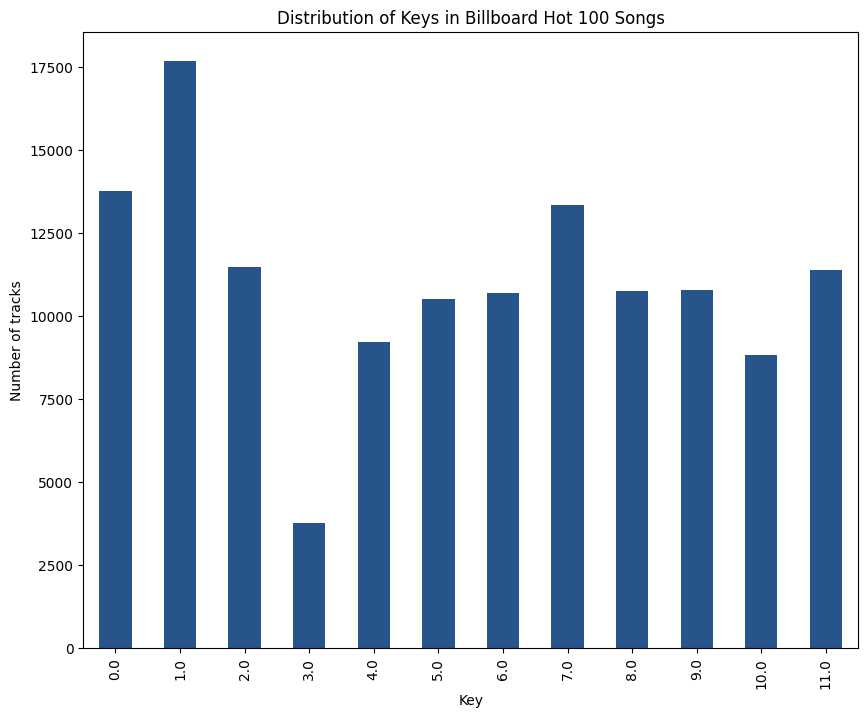

In [33]:
plt.figure(figsize=(10, 8))
key_grouped.plot(kind="bar", color="#27548A")
plt.title("Distribution of Keys in Billboard Hot 100 Songs")
plt.xlabel("Key")
plt.ylabel("Number of tracks")
plt.show()

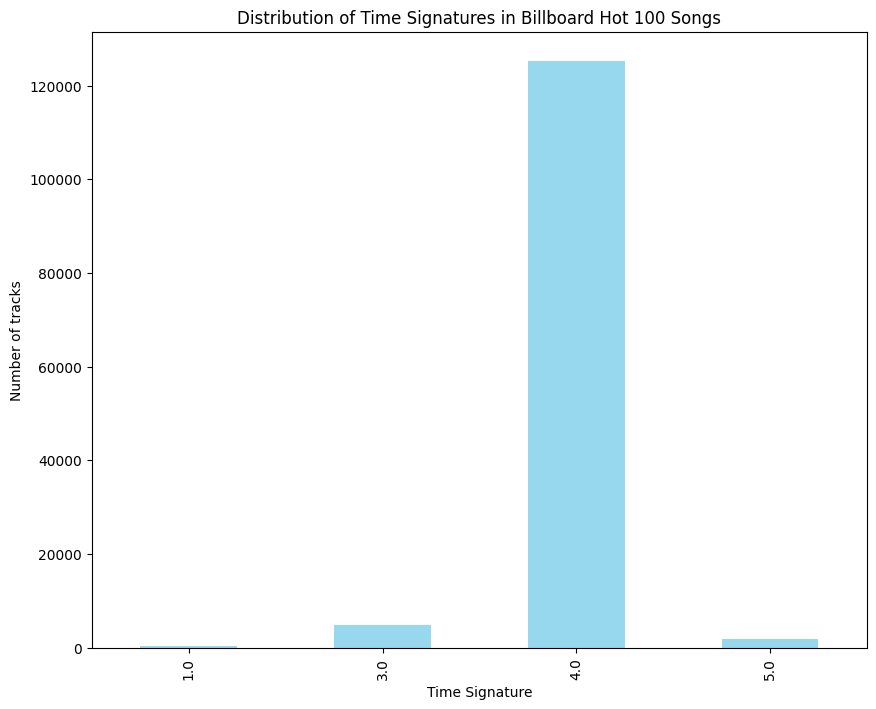

In [34]:
time_grouped = temp_data.groupby(["Time Signature"]).size()
plt.figure(figsize=(10, 8))
time_grouped.plot(kind="bar", color="#98D8EF")
plt.title("Distribution of Time Signatures in Billboard Hot 100 Songs")
plt.xlabel("Time Signature")
plt.ylabel("Number of tracks")
plt.show()

In [35]:
temp_data.to_csv("../data/processed/cleaned_billboard_data.csv", index=False)

## Summary of Key EDA Insights

After exploring audio features across 130k+ Billboard Hot 100 entries, several patterns emerge about what makes a typical charting track:

### Audio Characteristic of Charting tracks
**Tempo** : Most tracks fall between **95-145 bpm**, centering around **120 bpm** which is ideal for dancing and engagement.

**Danceability** : Most tracks score between **0.55 and 0.75** suggesting that tracks are made to be *groovable*, not aggressively dance-focused.

**Energy** : High energy is a staple with majority of tracks falling between **0.6 and 0.85**, reflecting intense, upbeat production.

**Valence (Mood)** : Tracks span both happy and sad signaling no bias in songs listened based on moods.

**Loudness** : Most tracks are fairly loud, clustering between **-7 and -4 dB**, emphasizing polished studio sound.

**Speechiness** : The vast majority of racks have **low speechiness**, meaning they are song more than spoken.

**Acosticness** : Most Charting Songs are **digitally produced** with low acoustic influence. Purely acoustic tracks are rare and even if they were made, it would be during a live session.

**Instrumentalness** : Chart toppers are overwhelmingly **vocal driven**. Instruments are practically absent.

**Liveness** Very few songs sound live which indicates that there is an unspoken preference for **clean, controlled studio production**.

### Musical Structure
**Key** : Songs in **C, D and G** dominate the charts. Other keys are rare possibly due to vocal or instrumental constraints.

**Time Signature** : **4/4** is overwhelmingly dominantand possibly the rhthmic backbone of almost all western music.